In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import os
from owi_data_2_pandas.io import API
import datetime
from pytz import utc
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

import dotenv
dotenv.load_dotenv()

from oma_clustering.oma_clustering_dbscan import ModeClusterer_DBSCAN
from oma_clustering.oma_clustering_hdbscan import ModeClusterer_HDBSCAN


In [3]:
loc = 'nw2'
turbine = 'c02'

user = os.getenv('API_USERNAME') 
password = os.getenv('API_PASSWORD')
root = r"http://10.0.0.138/api/v1/"

In [4]:
owi_api = API(api_root=root, username=user, password=password)

In [5]:
from src.data.make_dataset import get_big_data

start = datetime.datetime(2022, 10, 1, tzinfo=utc)
end = datetime.datetime(2023, 12, 1, tzinfo=utc)

location = 'nw2c02'
metrics = owi_api.metrics(locations=location)
#owi_api.query((start, end), location=location, metrics = metrics.metric).head()

# GET THE DATA
package_folder = os.path.dirname(os.path.dirname(os.getcwd()))
data_folder = os.path.join(package_folder, 'data')
try:
    data = pd.read_parquet(os.path.join(data_folder,'raw', loc, 'big_data', loc+turbine+'_big_data.parquet'))
except Exception:
    data = get_big_data(start, end, owi_api, location, metrics.metric, days=10)
    data.to_parquet(os.path.join(data_folder,'raw', loc, 'big_data', loc+turbine+'_big_data.parquet'))

In [6]:
mpe_data = data.filter(regex='mpe_')
def mpe_data_to_df(mpe_data, name_location, mode_direction):
    return pd.DataFrame.from_records(
            mpe_data['_'.join(['mpe', name_location, mode_direction])].explode().dropna().tolist()
        )\
            .set_index(
                mpe_data['_'.join(['mpe', name_location, mode_direction])].explode().dropna().index
            )

In [7]:
mpe_FA = mpe_data_to_df(mpe_data, 'NW2_C02', 'FA')
mpe_SS = mpe_data_to_df(mpe_data, 'NW2_C02', 'SS')

# SS mode clustering

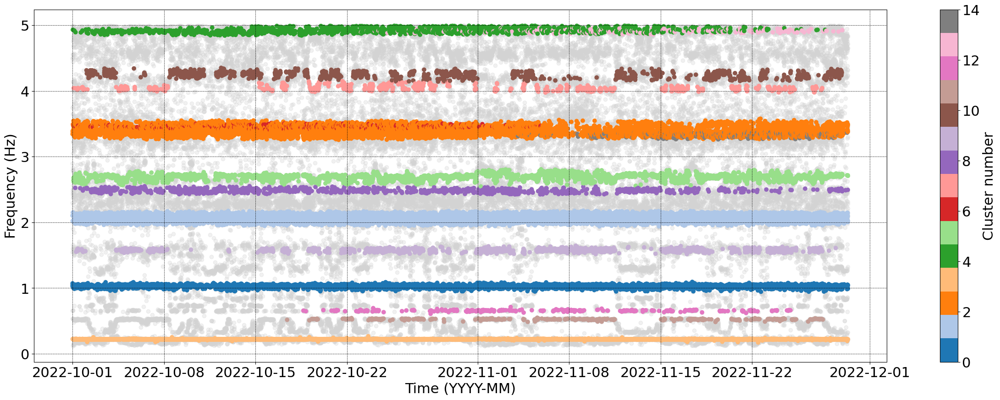

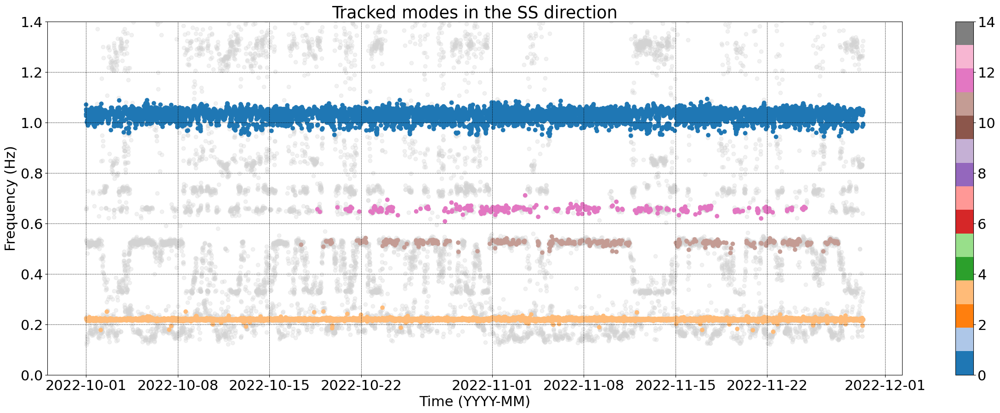

In [19]:
clustering_data = mpe_SS.iloc[:100000]

clusterer_DBSCAN = ModeClusterer_DBSCAN(
        eps = 4,
        min_samples = 100,
        multipliers = {"mean_frequency": 100, "size": 2, "mean_damping": 1},
        index_divider = 5000,
        cols = ['mean_frequency', 'size', 'mean_damping'],
        min_size = 5.0,
        max_damping = 5.0
)

clusterer_DBSCAN.fit(clustering_data)

clustered_modes_DBSCAN = clusterer_DBSCAN.predict(min_cluster_size=200)
clustered_modes_DBSCAN = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels != -1]

from oma_clustering.clustering_plots import generate_colormap

plt.rcParams.update({'font.size': 22})



fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
# Create new colormap
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax,label='Cluster number')

plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.show()

# write figure to figure_path
#figure_path = os.path.join(PROJECT_PATH, 'figures', 'clustering', 'OMA7')
#fig.savefig(os.path.join(figure_path, 'HDBSCAN_clustering.png'), bbox_inches='tight')

fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax)
plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.title('Tracked modes in the SS direction')
plt.ylim(0, 1.4)
plt.show()

SS1_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 3]
SS2_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 0]

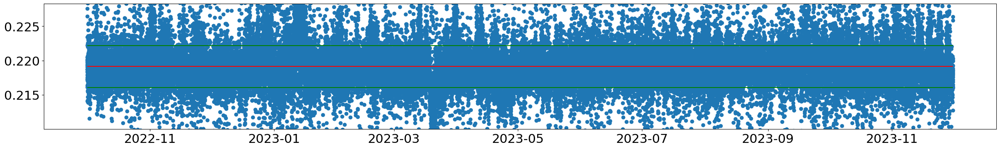

In [20]:
SS1_mean = SS1_mode['mean_frequency'].mean()
SS1_std = SS1_mode['mean_frequency'].std()
plt.figure(figsize=(30,4))
plt.scatter(mpe_SS.index, mpe_SS['mean_frequency'])
plt.hlines(SS1_mean, mpe_SS.index.min(), mpe_SS.index.max(), color='r')
plt.hlines(SS1_mean+SS1_std, mpe_SS.index.min(), mpe_SS.index.max(), color='g')
plt.hlines(SS1_mean-SS1_std, mpe_SS.index.min(), mpe_SS.index.max(), color='g')
plt.ylim(SS1_mean-3*SS1_std, SS1_mean+3*SS1_std)
plt.show()
plt.close()

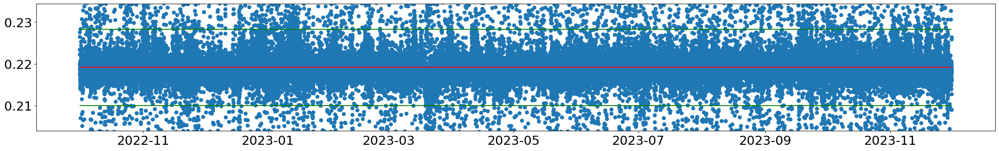

In [25]:
mean_ = SS1_mode['mean_frequency'].mean()
std_ = SS1_mode['mean_frequency'].std()
mpe_ = mpe_SS
plt.figure(figsize=(30,4))
plt.scatter(mpe_.index, mpe_['mean_frequency'])
plt.hlines(mean_, mpe_.index.min(), mpe_.index.max(), color='r')
plt.hlines(mean_+3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.hlines(mean_-3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.ylim(mean_-5*std_, mean_+5*std_)
plt.show()
plt.close()

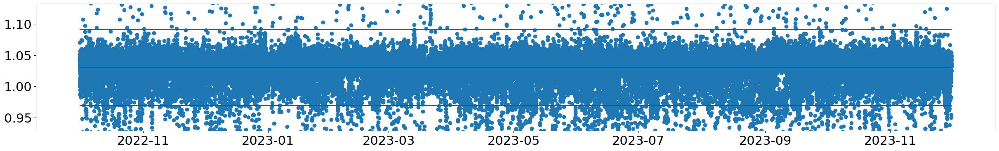

In [22]:
mean_ = SS2_mode['mean_frequency'].mean()
std_ = SS2_mode['mean_frequency'].std()
mpe_ = mpe_SS
plt.figure(figsize=(30,4))
plt.scatter(mpe_.index, mpe_['mean_frequency'])
plt.hlines(mean_, mpe_.index.min(), mpe_.index.max(), color='r')
plt.hlines(mean_+3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.hlines(mean_-3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.ylim(mean_-5*std_, mean_+5*std_)
plt.show()
plt.close()

# FA mode clustering

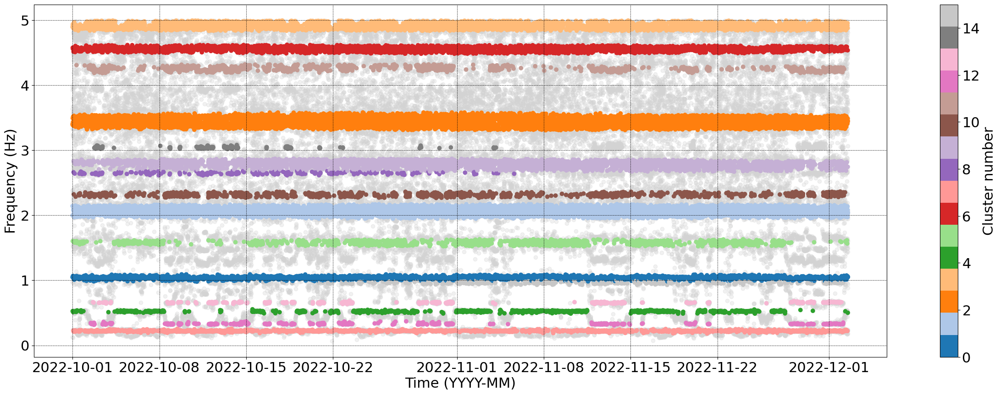

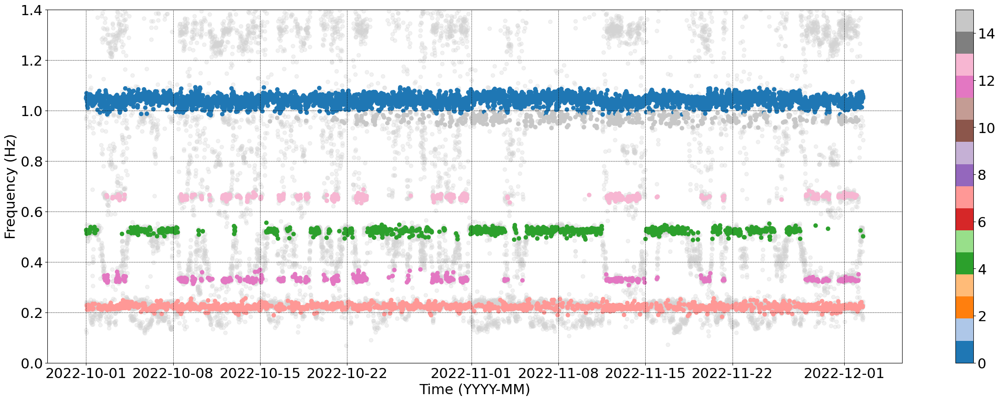

In [23]:
clustering_data = mpe_FA.iloc[:100000]

clusterer_DBSCAN = ModeClusterer_DBSCAN(
        eps = 5,
        min_samples = 100,
        multipliers = {"mean_frequency": 200, "size": 2},# "mean_damping": 0.1},
        index_divider = 5000,
        cols = ['mean_frequency', 'size'],# 'mean_damping'],
        min_size = 5.0,
        max_damping = 5.0
)

clusterer_DBSCAN.fit(clustering_data)

clustered_modes_DBSCAN = clusterer_DBSCAN.predict(min_cluster_size=200)
clustered_modes_DBSCAN = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels != -1]

from oma_clustering.clustering_plots import generate_colormap

plt.rcParams.update({'font.size': 22})



fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
# Create new colormap
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax,label='Cluster number')

plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.show()

# write figure to figure_path
#figure_path = os.path.join(PROJECT_PATH, 'figures', 'clustering', 'OMA7')
#fig.savefig(os.path.join(figure_path, 'HDBSCAN_clustering.png'), bbox_inches='tight')

fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax)
plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0, 1.4)
plt.show()

FA1_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 7]
FA2_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 0]

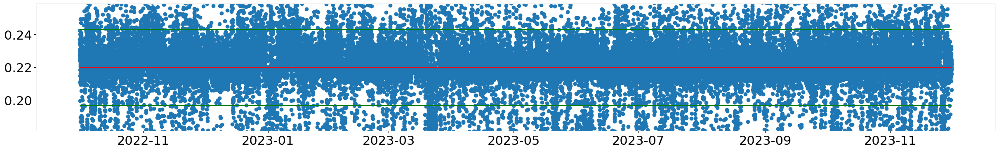

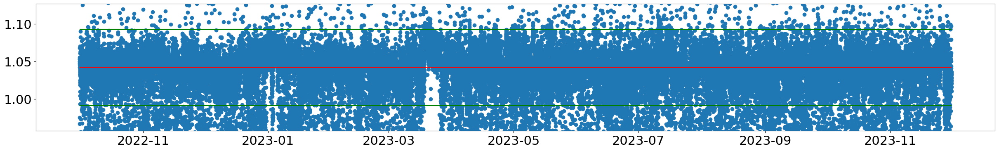

In [24]:
mean_ = FA1_mode['mean_frequency'].mean()
std_ = FA1_mode['mean_frequency'].std()
mpe_ = mpe_FA
plt.figure(figsize=(30,4))
plt.scatter(mpe_.index, mpe_['mean_frequency'])
plt.hlines(mean_, mpe_.index.min(), mpe_.index.max(), color='r')
plt.hlines(mean_+3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.hlines(mean_-3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.ylim(mean_-5*std_, mean_+5*std_)
plt.show()
plt.close()

mean_ = FA2_mode['mean_frequency'].mean()
std_ = FA2_mode['mean_frequency'].std()
mpe_ = mpe_FA
plt.figure(figsize=(30,4))
plt.scatter(mpe_.index, mpe_['mean_frequency'])
plt.hlines(mean_, mpe_.index.min(), mpe_.index.max(), color='r')
plt.hlines(mean_+3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.hlines(mean_-3*std_, mpe_.index.min(), mpe_.index.max(), color='g')
plt.ylim(mean_-5*std_, mean_+5*std_)
plt.show()
plt.close()

# HDBSCAN

In [23]:
clustering_data = mpe_SS.iloc[:100000]

clusterer_HDBSCAN = ModeClusterer_HDBSCAN(
        min_cluster_size = 100,
        min_samples = 100,
        multipliers = {"mean_frequency": 200, "size": 2, "mean_damping": 1},
        index_divider = 5000,
        cols = ['mean_frequency', 'size', 'mean_damping'],
        min_size = 5.0,
        max_damping = 5.0
)

clusterer_HDBSCAN.fit(clustering_data)

clustered_modes_HDBSCAN = clusterer_HDBSCAN.predict(min_cluster_size=200)
clustered_modes_HDBSCAN = clustered_modes_HDBSCAN[clustered_modes_HDBSCAN.labels != -1]

from oma_clustering.clustering_plots import generate_colormap

plt.rcParams.update({'font.size': 22})



fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
# Create new colormap
cmap = generate_colormap(len(clustered_modes_HDBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_HDBSCAN.index, clustered_modes_HDBSCAN['mean_frequency'], c=clustered_modes_HDBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax,label='Cluster number')

plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.show()

# write figure to figure_path
#figure_path = os.path.join(PROJECT_PATH, 'figures', 'clustering', 'OMA7')
#fig.savefig(os.path.join(figure_path, 'HDBSCAN_clustering.png'), bbox_inches='tight')

fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
cmap = generate_colormap(len(clustered_modes_HDBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_HDBSCAN.index, clustered_modes_HDBSCAN['mean_frequency'], c=clustered_modes_HDBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax)
plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.title('Tracked modes in the SS direction')
plt.ylim(0, 1.4)
plt.show()

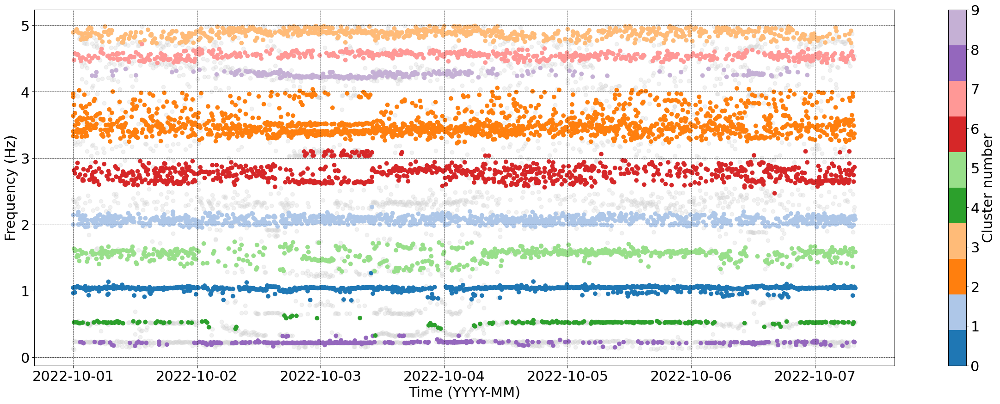

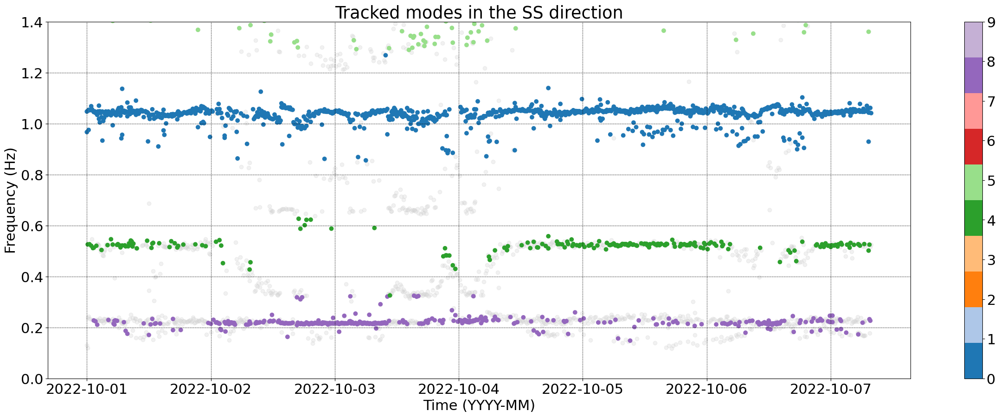

In [ ]:
clustering_data = mpe_FA.iloc[:100000]


clusterer_HDBSCAN = ModeClusterer_HDBSCAN(
        min_cluster_size = 100,
        min_samples = 100,
        multipliers = {"mean_frequency": 200, "size": 2},# "mean_damping": 1},
        index_divider = 5000,
        cols = ['mean_frequency', 'size'],# 'mean_damping'],
        min_size = 5.0,
        max_damping = 5.0
)

clusterer_HDBSCAN.fit(clustering_data)

clustered_modes_HDBSCAN = clusterer_HDBSCAN.predict(min_cluster_size=200)
clustered_modes_HDBSCAN = clustered_modes_HDBSCAN[clustered_modes_HDBSCAN.labels != -1]

from oma_clustering.clustering_plots import generate_colormap

plt.rcParams.update({'font.size': 22})



fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
# Create new colormap
cmap = generate_colormap(len(clustered_modes_HDBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_HDBSCAN.index, clustered_modes_HDBSCAN['mean_frequency'], c=clustered_modes_HDBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax,label='Cluster number')

plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.show()

# write figure to figure_path
#figure_path = os.path.join(PROJECT_PATH, 'figures', 'clustering', 'OMA7')
#fig.savefig(os.path.join(figure_path, 'HDBSCAN_clustering.png'), bbox_inches='tight')

fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
cmap = generate_colormap(len(clustered_modes_HDBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_HDBSCAN.index, clustered_modes_HDBSCAN['mean_frequency'], c=clustered_modes_HDBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax)
plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.title('Tracked modes in the SS direction')
plt.ylim(0, 1.4)
plt.show()

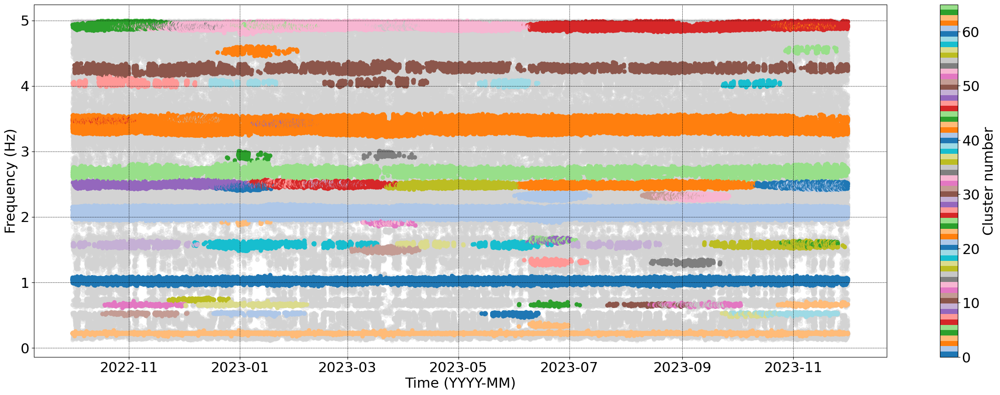

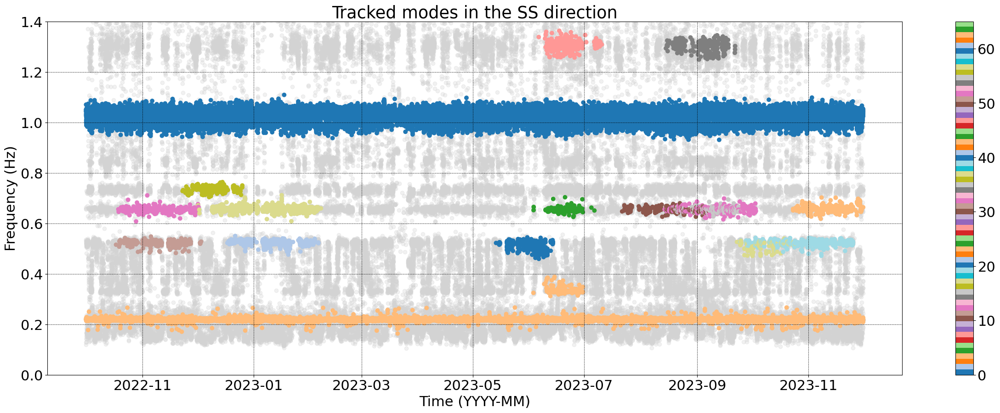

In [26]:
clustering_data = mpe_SS#.iloc[:100000]

clusterer_DBSCAN = ModeClusterer_DBSCAN(
        eps = 4,
        min_samples = 100,
        multipliers = {"mean_frequency": 100, "size": 2, "mean_damping": 1},
        index_divider = 5000,
        cols = ['mean_frequency', 'size', 'mean_damping'],
        min_size = 5.0,
        max_damping = 5.0
)

clusterer_DBSCAN.fit(clustering_data)

clustered_modes_DBSCAN = clusterer_DBSCAN.predict(min_cluster_size=200)
clustered_modes_DBSCAN = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels != -1]

from oma_clustering.clustering_plots import generate_colormap

plt.rcParams.update({'font.size': 22})



fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
# Create new colormap
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax,label='Cluster number')

plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.show()

# write figure to figure_path
#figure_path = os.path.join(PROJECT_PATH, 'figures', 'clustering', 'OMA7')
#fig.savefig(os.path.join(figure_path, 'HDBSCAN_clustering.png'), bbox_inches='tight')

fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax)
plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.title('Tracked modes in the SS direction')
plt.ylim(0, 1.4)
plt.show()

SS1_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 3]
SS2_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 0]

In [27]:
SS1_mode.to_parquet(os.path.join(data_folder,'interim', loc, 'tracked_modes', 'dbscan_based', loc+turbine+'_SS1_mode.parquet'))
SS2_mode.to_parquet(os.path.join(data_folder,'interim', loc, 'tracked_modes', 'dbscan_based', loc+turbine+'_SS2_mode.parquet'))

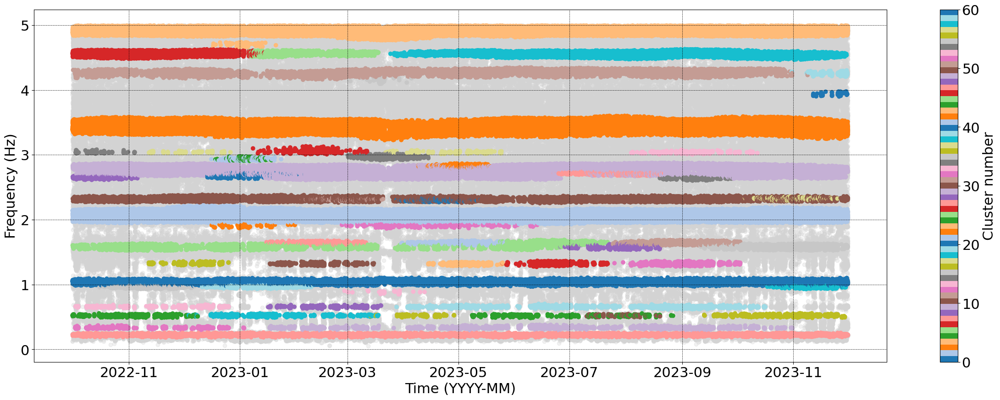

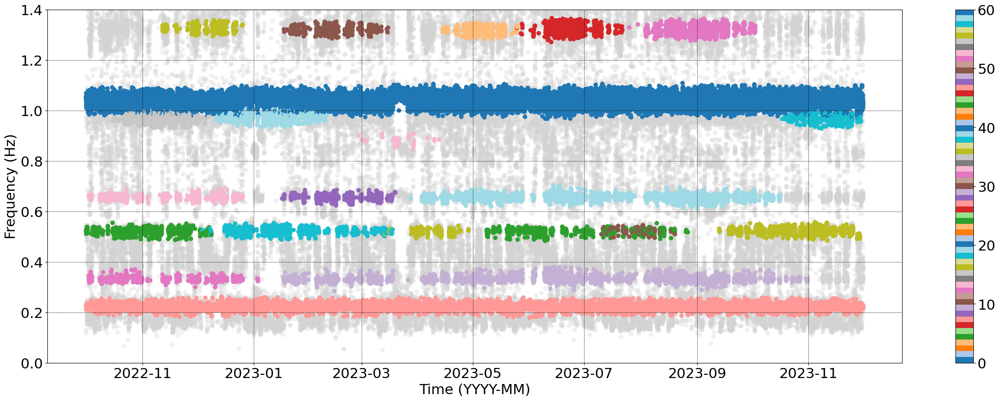

In [28]:
clustering_data = mpe_FA#.iloc[:100000]

clusterer_DBSCAN = ModeClusterer_DBSCAN(
        eps = 5,
        min_samples = 100,
        multipliers = {"mean_frequency": 200, "size": 2},# "mean_damping": 0.1},
        index_divider = 5000,
        cols = ['mean_frequency', 'size'],# 'mean_damping'],
        min_size = 5.0,
        max_damping = 5.0
)

clusterer_DBSCAN.fit(clustering_data)

clustered_modes_DBSCAN = clusterer_DBSCAN.predict(min_cluster_size=200)
clustered_modes_DBSCAN = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels != -1]

from oma_clustering.clustering_plots import generate_colormap

plt.rcParams.update({'font.size': 22})



fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
# Create new colormap
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax,label='Cluster number')

plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.show()

# write figure to figure_path
#figure_path = os.path.join(PROJECT_PATH, 'figures', 'clustering', 'OMA7')
#fig.savefig(os.path.join(figure_path, 'HDBSCAN_clustering.png'), bbox_inches='tight')

fig, ax = plt.subplots(figsize = (30,10))

ax.scatter(clustering_data.index, clustering_data['mean_frequency'], alpha=0.3, color='lightgrey')
cmap = generate_colormap(len(clustered_modes_DBSCAN.labels.unique()))

im = ax.scatter(clustered_modes_DBSCAN.index, clustered_modes_DBSCAN['mean_frequency'], c=clustered_modes_DBSCAN['labels'], cmap = cmap)
plt.grid(True, color='k', linestyle='--', linewidth=0.5)
cbar = plt.colorbar(im, ax=ax)
plt.xlabel('Time (YYYY-MM)')
plt.ylabel('Frequency (Hz)')
plt.ylim(0, 1.4)
plt.show()

FA1_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 7]
FA2_mode = clustered_modes_DBSCAN[clustered_modes_DBSCAN.labels == 0]

In [29]:
FA1_mode.to_parquet(os.path.join(data_folder,'interim', loc, 'tracked_modes', 'dbscan_based', loc+turbine+'_FA1_mode.parquet'))
FA2_mode.to_parquet(os.path.join(data_folder,'interim', loc, 'tracked_modes', 'dbscan_based', loc+turbine+'_FA2_mode.parquet'))